### Classification of pedogogical Strategy, so main goal to develop a model to check if a pedagogical stratgey present or not

# 1- Data Preprocessing, EDA and prepration

In [ ]:
import pandas as pd
import numpy as np
import torch
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import nltk
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, Trainer, TrainingArguments, EarlyStoppingCallback

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
data = pd.read_csv('bridge_data_task1.csv')

In [ ]:
data

,ID,Split,Lesson_Topic,History,Unnamed: 4,Peda_Strategies,Label
0,411460689,test,7.4D.Percent Change,||| teacher: Plus 3 points added to your score...,This is a common mistake. To find the percent ...,explain_concept,1
1,178346128,train,Not Available,teacher: Hi! ||| student: yo! what brought you...,Do you think Neural Link will allow you to liv...,NaN,0
2,9334671283,test,Not Available,teacher: Hi! ||| student: Have you seen any go...,Oh really? To be honest I think the actor is n...,NaN,0
3,1142264546,val,Not Available,teacher: Hi! ||| student: Hey! How are you fee...,"lol what's a klutz? yeah I like, but I'm not good",NaN,0
4,3690027652,train,Not Available,teacher: Hi! ||| student: How's it going? ||| ...,Maybe its a little too early to even be thinki...,NaN,0
...,...,...,...,...,...,...,...
1395,6772540142,train,Not Available,teacher: Hi! ||| student: Hey ||| teacher: How...,Oh I see. What do you do?,NaN,0
1396,6269367829,train,Not Available,"teacher: Hi! ||| student: Hey, how are you 🙂 |...",Nice! Do you refer to work or anything else?,NaN,0
1397,2640496073,train,Not Available,"teacher: Hi! ||| student: Hey, what's up? ||| ...","It was scary! It was actually Kingda Ka, the w...",NaN,0
1398,298950851,train,1.3B.Addition & Subtraction Properties (Review...,||| teacher: Great! ||| teacher: This is our n...,Great try! It does not matter which order you ...,provide_hint,1


In [ ]:
data.rename(columns={'Unnamed: 4': 'Expert_Human_Tutor'}, inplace=True)
data.drop_duplicates(subset='ID', keep='first', inplace=True)
data.drop(['Lesson_Topic', 'History', 'Peda_Strategies'], axis=1, inplace=True)

In [ ]:
data

,ID,Split,Expert_Human_Tutor,Label
0,411460689,test,This is a common mistake. To find the percent ...,1
1,178346128,train,Do you think Neural Link will allow you to liv...,0
2,9334671283,test,Oh really? To be honest I think the actor is n...,0
3,1142264546,val,"lol what's a klutz? yeah I like, but I'm not good",0
4,3690027652,train,Maybe its a little too early to even be thinki...,0
...,...,...,...,...
1382,2850095108,val,Great try! Can you please explain how you got 68?,1
1383,397471795,train,well I actually think about pursuing photograp...,0
1393,1402118231,train,I'm going to the bahamas. Can't wait!!!,0
1397,2640496073,train,"It was scary! It was actually Kingda Ka, the w...",0


In [ ]:
import pandas as pd

split_counts = data['Split'].value_counts()

split_label_counts = data.groupby(['Split', 'Label']).size().unstack(fill_value=0)

split_counts, split_label_counts


(Split
 train    582
 test     223
 val       73
 Name: count, dtype: int64,
 Label    0    1
 Split          
 test    91  132
 train  303  279
 val     25   48)

Remove duplicate

In [ ]:
import pandas as pd

data = pd.read_csv('bridge_data_task1.csv')

data.drop_duplicates(subset='ID', keep='first', inplace=True)

split_counts = data['Split'].value_counts()

split_label_counts = data.groupby(['Split', 'Label']).size().unstack(fill_value=0)

print("Split Counts:\n", split_counts)
print("\nLabel Distribution per Split:\n", split_label_counts)

data.to_csv('bridge_data_task1_no_duplicates.csv', index=False)


Split Counts:
 Split
train    582
test     223
val       73
Name: count, dtype: int64

Label Distribution per Split:
 Label    0    1
Split          
test    91  132
train  303  279
val     25   48


# Balance the training Samples

### So now i will increase the number of samples of train set to make them 1000 samples of 0 and 1000 samples of 1

To increase the number of samples of 0 i will add random conversation that not contain pedagology strategy

In [ ]:
!pip install datasets


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 11.8 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.



### for the class 0 i will use dataset from hugging face which contain conversation with no pedagogy strategy so i will add 697 samples to increase the number of samples from 303 to 1000

In [ ]:
from datasets import load_dataset

dataset = load_dataset("li2017dailydialog/daily_dialog")

dialogues = dataset['train']['dialog']

flat_sentences = [sentence for dialog in dialogues for sentence in dialog]
print(flat_sentences[:10])


['Say , Jim , how about going for a few beers after dinner ? ', ' You know that is tempting but is really not good for our fitness . ', ' What do you mean ? It will help us to relax . ', " Do you really think so ? I don't . It will just make us fat and act silly . Remember last time ? ", " I guess you are right.But what shall we do ? I don't feel like sitting at home . ", ' I suggest a walk over to the gym where we can play singsong and meet some of our friends . ', " That's a good idea . I hear Mary and Sally often go there to play pingpong.Perhaps we can make a foursome with them . ", ' Sounds great to me ! If they are willing , we could ask them to go dancing with us.That is excellent exercise and fun , too . ', " Good.Let ' s go now . ", ' All right . ']


In [ ]:
import pandas as pd
import re

dataset = load_dataset("li2017dailydialog/daily_dialog")

dialogues = dataset['train']['dialog']
flat_sentences = [sentence for dialog in dialogues for sentence in dialog]

cleaned_sentences = [re.sub(r'\s+', ' ', re.sub(r'[^\w\s,?!.]', '', sentence.strip())) for sentence in flat_sentences[:2000]]

df_cleaned_sentences = pd.DataFrame(cleaned_sentences, columns=['Cleaned_Conversation_Sentences'])

df_cleaned_sentences.head()


,Cleaned_Conversation_Sentences
0,"Say , Jim , how about going for a few beers af..."
1,You know that is tempting but is really not go...
2,What do you mean ? It will help us to relax .
3,Do you really think so ? I dont . It will just...
4,I guess you are right.But what shall we do ? I...


In [ ]:
from datasets import load_dataset
import pandas as pd
import re
from sklearn.model_selection import train_test_split

dataset = load_dataset("li2017dailydialog/daily_dialog")

dialogues = dataset['train']['dialog']
flat_sentences = [sentence for dialog in dialogues for sentence in dialog]

cleaned_sentences = [re.sub(r'\s+', ' ', re.sub(r'[^\w\s,?!.]', '', sentence.strip())) for sentence in flat_sentences[:2000]]

df_sentences = pd.DataFrame(cleaned_sentences, columns=['Cleaned_Conversation_Sentences']).sample(frac=1, random_state=42).reset_index(drop=True)

train, temp = train_test_split(df_sentences, test_size=0.2, random_state=42)
val, test = train_test_split(temp, test_size=0.5, random_state=42)

train.to_csv("daily_train_sentences.csv", index=False)
val.to_csv("daily_val_sentences.csv", index=False)
test.to_csv("daily_test_sentences.csv", index=False)

print("Files saved: daily_train_sentences.csv, daily_val_sentences.csv, daily_test_sentences.csv")


Files saved: daily_train_sentences.csv, daily_val_sentences.csv, daily_test_sentences.csv


In [ ]:
import pandas as pd

updated_bridge_data = pd.read_csv('bridge_data_task1_no_duplicates.csv')

updated_bridge_data.rename(columns={'Unnamed: 4': 'Expert_Human_Tutor'}, inplace=True)

updated_bridge_data = updated_bridge_data[['Split', 'Expert_Human_Tutor', 'Label']]

train_data = updated_bridge_data[updated_bridge_data['Split'] == 'train']
test_data = updated_bridge_data[updated_bridge_data['Split'] == 'test']
val_data = updated_bridge_data[updated_bridge_data['Split'] == 'val']

train_data.to_csv("bridge_train_data.csv", index=False)
test_data.to_csv("bridge_test_data.csv", index=False)
val_data.to_csv("bridge_val_data.csv", index=False)

"Files saved: bridge_train_data.csv, bridge_test_data.csv, bridge_val_data.csv"


'Files saved: bridge_train_data.csv, bridge_test_data.csv, bridge_val_data.csv'

### So now manullay i increased the number of trianing samples of class 0 from hugging face library to 1000 and now i will increase the number of samples of class 1 from 297 to 1000 using chatgpt paraphrase and now the training data become 2000 samples, 1000 samples for class 1 and 1000 sample for class 0

In [ ]:
New_train_data = pd.read_csv('bridge_train_datatset13Nov.csv')

In [ ]:
New_train_data

,Split,Expert_Human_Tutor,Label
0,train,Do you think Neural Link will allow you to liv...,0
1,train,Maybe its a little too early to even be thinki...,0
2,train,BRILLIANT. I love it.,0
3,train,"Great try! When you plot the point (3, 2) you ...",1
4,train,"Hm, not quite. In order for a shape to be a qu...",1
...,...,...,...
1995,train,Close. We don't need to subtract 1 from the hu...,1
1996,train,What is 4 times 4?,1
1997,train,B is very close to the right answer. Can you d...,1
1998,train,I would like for you to recalculate your answe...,1


In [ ]:
New_train_data['Label'].value_counts()

Label
0    1000
1    1000
Name: count, dtype: int64

In [ ]:
!pip install torch
!pip install transformers
!pip install nltk
!pip install scikit-learn
!pip install lime
!pip install seaborn matplotlib

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ---------------------------------------- 0.0/203.0 MB ? eta -:--:--
   ---------------------------------------- 0.3/203.0 MB ? eta -:--:--
   ---------------------------------------- 1.0/203.0 MB 4.2 MB/s eta 0:00:49
    --------------------------------------- 3.7/203.0 MB 8.4 MB/s eta 0:00:24
   - -------------------------------------- 7.9/203.0 MB 12.2 MB/s eta 0:00:17
   -- ------------------------------------- 12.3/203.0 MB 14.6 MB/s eta 0:00:14
   --- ------------------------------------ 16.3/203.0 MB 15.7 MB/s eta 0:00:12
   ---- ----------------------------------- 20.7/203.0 MB 16.6 MB/s eta 0:00:12
   ---- ----------------------------------- 23.6/203.0 MB 16.1 MB/s eta 0:00:12
   ----- ---------------------------------- 26.7/203.0 MB 16.1 MB/s eta 0:00:11
   ----- ---------------------------------- 26.7/203.0 MB 16.1 MB/s eta 

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.5.1+cu118 requires torch==2.5.1+cu118, but you have torch 2.5.1 which is incompatible.


Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Besher\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Besher\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

# Bert Performance Before fine tuning

### Now i will test the performance of the model before fine tune it on the test set

In [ ]:
pip install --upgrade torch torchvision transformers

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\655000884.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['text'] = test_df['History'].apply(clean_text)
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\655000884.py:52: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(va

Pretrained Model Performance on Test Set: {'accuracy': 0.6547085201793722, 'f1': 0.771513353115727, 'precision': 0.6341463414634146, 'recall': 0.9848484848484849}


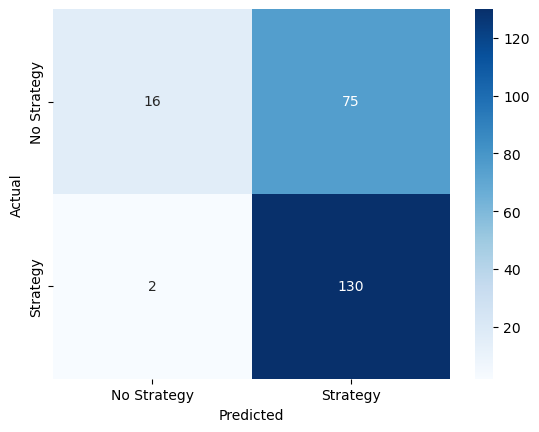

In [ ]:
import pandas as pd
import torch
import numpy as np
import re
from transformers import BertTokenizer, BertForSequenceClassification
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

df = pd.read_csv('bridge_data_task1_no_duplicates.csv')

test_df = df[df['Split'] == 'test']

def clean_text(text):
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

test_df['text'] = test_df['History'].apply(clean_text)

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

def encode_texts(texts, tokenizer, max_length=128):
    return tokenizer(
        list(texts),
        padding=True,
        truncation=True,
        max_length=max_length,
        return_tensors="pt"
    )

test_encodings = encode_texts(test_df['text'], tokenizer)
test_labels = torch.tensor(test_df['Label'].values)

class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

test_dataset = CustomDataset(test_encodings, test_labels)

model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2)

model.eval()
predictions = []
with torch.no_grad():
    for i in range(len(test_dataset)):
        inputs = {key: test_dataset[i][key].unsqueeze(0) for key in test_encodings.keys()}
        outputs = model(**inputs)
        pred = outputs.logits.argmax(-1).item()
        predictions.append(pred)

def compute_metrics(predictions, labels):
    precision, recall, f1, _ = precision_recall_fscore_support(labels, predictions, average='binary')
    acc = accuracy_score(labels, predictions)
    return {
        'accuracy': acc,
        'f1': f1,
        'precision': precision,
        'recall': recall
    }

test_metrics = compute_metrics(predictions, test_labels)
print("Pretrained Model Performance on Test Set:", test_metrics)

cm = confusion_matrix(test_labels, predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


### Before fine tuning : accuracy': 0.6547085201793722, 'f1': 0.771513353115727, 'precision': 0.6341463414634146, 'recall': 0.9848484848484849

In [ ]:
pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118, https://pypi.ngc.nvidia.com
     ---------------------------------------- 0.0/2.7 GB ? eta -:--:--
     ---------------------------------------- 0.0/2.7 GB 6.6 MB/s eta 0:06:47
     ---------------------------------------- 0.0/2.7 GB 6.2 MB/s eta 0:07:17
     ---------------------------------------- 0.0/2.7 GB 5.8 MB/s eta 0:07:48
     ---------------------------------------- 0.0/2.7 GB 5.2 MB/s eta 0:08:38
     ---------------------------------------- 0.0/2.7 GB 4.7 MB/s eta 0:09:33
     ---------------------------------------- 0.0/2.7 GB 5.3 MB/s eta 0:08:32
     ---------------------------------------- 0.0/2.7 GB 5.7 MB/s eta 0:07:51
     ---------------------------------------- 0.0/2.7 GB 6.1 MB/s eta 0:07:22
     ---------------------------------------- 0.0/2.7 GB 6.4 MB/s eta 0:07:00
     ---------------------------------------- 0.0/2.7 GB 6.4 MB/s eta 0:06:58
     ---------------------------------------- 0.0/2.7 GB 6.6 

  You can safely remove it manually.


In [ ]:
!pip install nvidia-pyindex
!pip install nvidia-cuda-runtime-cu11

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [ ]:
test_val = pd.read_csv('bridge_data_task1.csv')

In [ ]:
test_val

,ID,Split,Lesson_Topic,History,Unnamed: 4,Peda_Strategies,Label
0,411460689,test,7.4D.Percent Change,||| teacher: Plus 3 points added to your score...,This is a common mistake. To find the percent ...,explain_concept,1
1,178346128,train,Not Available,teacher: Hi! ||| student: yo! what brought you...,Do you think Neural Link will allow you to liv...,NaN,0
2,9334671283,test,Not Available,teacher: Hi! ||| student: Have you seen any go...,Oh really? To be honest I think the actor is n...,NaN,0
3,1142264546,val,Not Available,teacher: Hi! ||| student: Hey! How are you fee...,"lol what's a klutz? yeah I like, but I'm not good",NaN,0
4,3690027652,train,Not Available,teacher: Hi! ||| student: How's it going? ||| ...,Maybe its a little too early to even be thinki...,NaN,0
...,...,...,...,...,...,...,...
1395,6772540142,train,Not Available,teacher: Hi! ||| student: Hey ||| teacher: How...,Oh I see. What do you do?,NaN,0
1396,6269367829,train,Not Available,"teacher: Hi! ||| student: Hey, how are you 🙂 |...",Nice! Do you refer to work or anything else?,NaN,0
1397,2640496073,train,Not Available,"teacher: Hi! ||| student: Hey, what's up? ||| ...","It was scary! It was actually Kingda Ka, the w...",NaN,0
1398,298950851,train,1.3B.Addition & Subtraction Properties (Review...,||| teacher: Great! ||| teacher: This is our n...,Great try! It does not matter which order you ...,provide_hint,1


# Fine Tuning BERT on the train data

In [ ]:
import pandas as pd
import torch
import numpy as np
import re
from transformers import BertTokenizer, BertForSequenceClassification, Trainer, TrainingArguments
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from lime.lime_text import LimeTextExplainer

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = df[df['Split'] == 'test']
val_df = df[df['Split'] == 'val']
def clean_text(text):
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()


In [ ]:
df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)


In [ ]:
train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
val_df['text'] = df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = df['Expert_Human_Tutor'].apply(clean_text)

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

def encode_texts(texts, tokenizer, max_length=128):
    return tokenizer(
        list(texts),
        padding=True,
        truncation=True,
        max_length=max_length,
        return_tensors="pt"
    )



C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\3392422279.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_df['text'] = df['Expert_Human_Tutor'].apply(clean_text)
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\3392422279.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['text'] = df['Expert_Human_Tutor'].apply(clean_text)


In [ ]:

train_encodings = encode_texts(train_df['text'], tokenizer)
val_encodings = encode_texts(val_df['text'], tokenizer)
test_encodings = encode_texts(test_df['text'], tokenizer)

train_labels = torch.tensor(train_df['Label'].values)
val_labels = torch.tensor(val_df['Label'].values)
test_labels = torch.tensor(test_df['Label'].values)

class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = CustomDataset(train_encodings, train_labels)
val_dataset = CustomDataset(val_encodings, val_labels)
test_dataset = CustomDataset(test_encodings, test_labels)



In [ ]:
import torch

if torch.cuda.is_available():
    print("GPU detected!")
    print(f"Device Name: {torch.cuda.get_device_name(0)}")
    print(f"Number of GPUs available: {torch.cuda.device_count()}")
else:
    print("No GPU detected. Please ensure a GPU is available.")


GPU detected!
Device Name: NVIDIA GeForce RTX 3060
Number of GPUs available: 1


In [ ]:
from transformers import BertForSequenceClassification, Trainer, TrainingArguments, TrainerCallback
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2).to(device)

training_args = TrainingArguments(
    output_dir='./results',
    eval_strategy="epoch",
    save_strategy="epoch",
    save_total_limit=1,
    load_best_model_at_end=True,
    metric_for_best_model="eval_f1",
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=10,
    logging_dir='./logs',
    logging_steps=10,
)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='binary')
    acc = accuracy_score(labels, preds)
    return {
        'accuracy': acc,
        'f1': f1,
        'precision': precision,
        'recall': recall
    }

class TestSetCallback(TrainerCallback):
    def on_epoch_end(self, args, state, control, **kwargs):
        test_results = trainer.evaluate(eval_dataset=test_dataset)
        print(f"Epoch {state.epoch}: Test F1 Score: {test_results['eval_f1']:.4f}")

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
    callbacks=[TestSetCallback()]
)

trainer.train()

best_checkpoint = trainer.state.best_model_checkpoint
if best_checkpoint:
    print(f"Loading best model from: {best_checkpoint}")
    trainer.model = BertForSequenceClassification.from_pretrained(best_checkpoint).to(device)
else:
    print("Best model checkpoint not found; using last model state.")
    trainer.model = model

test_results = trainer.evaluate(eval_dataset=test_dataset)

print("Best Model Test Set Performance:")
print(f"Accuracy: {test_results['eval_accuracy'] * 100:.2f}%")
print(f"F1 Score: {test_results['eval_f1'] * 100:.2f}%")
print(f"Precision: {test_results['eval_precision'] * 100:.2f}%")
print(f"Recall: {test_results['eval_recall'] * 100:.2f}%")

trainer.save_model('./results/best_model6')





Using device: cuda


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,0.051100,0.185485,0.955157,0.960938,0.991935,0.931818
2,0.148600,0.079520,0.973094,0.976744,1.000000,0.954545
3,0.070300,0.153062,0.964126,0.968750,1.000000,0.939394
4,0.106900,0.209896,0.964126,0.968750,1.000000,0.939394
5,0.000400,0.117443,0.982063,0.984615,1.000000,0.969697
6,0.000100,0.063696,0.986547,0.988506,1.000000,0.977273
7,0.000100,0.187802,0.973094,0.976744,1.000000,0.954545
8,0.000200,0.152170,0.982063,0.984615,1.000000,0.969697
9,0.000000,0.119509,0.982063,0.984615,1.000000,0.969697
10,0.000400,0.119547,0.982063,0.984615,1.000000,0.969697


Epoch 1.0: Test F1 Score: 0.9609


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Epoch 2.0: Test F1 Score: 0.9767


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Epoch 3.0: Test F1 Score: 0.9688


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Epoch 4.0: Test F1 Score: 0.9688


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Epoch 5.0: Test F1 Score: 0.9846


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Epoch 6.0: Test F1 Score: 0.9885


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Epoch 7.0: Test F1 Score: 0.9767


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Epoch 8.0: Test F1 Score: 0.9846


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Epoch 9.0: Test F1 Score: 0.9846


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}

Epoch 10.0: Test F1 Score: 0.9846
Best model checkpoint not found; using last model state.


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Best Model Test Set Performance:
Accuracy: 98.21%
F1 Score: 98.46%
Precision: 100.00%
Recall: 96.97%


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


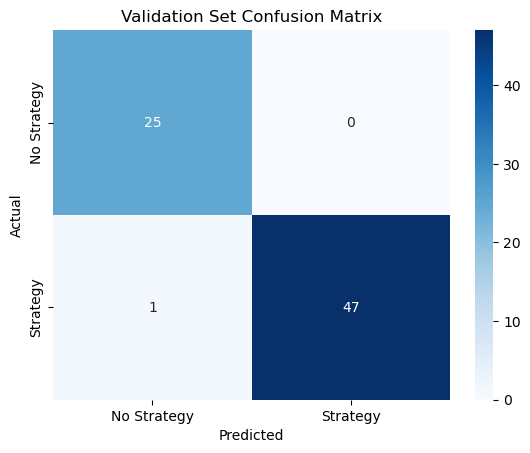

C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Validation Results: {'eval_loss': 0.14826315641403198, 'eval_accuracy': 0.9863013698630136, 'eval_f1': 0.9894736842105263, 'eval_precision': 1.0, 'eval_recall': 0.9791666666666666, 'eval_runtime': 0.128, 'eval_samples_per_second': 570.32, 'eval_steps_per_second': 78.126, 'epoch': 10.0}


C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


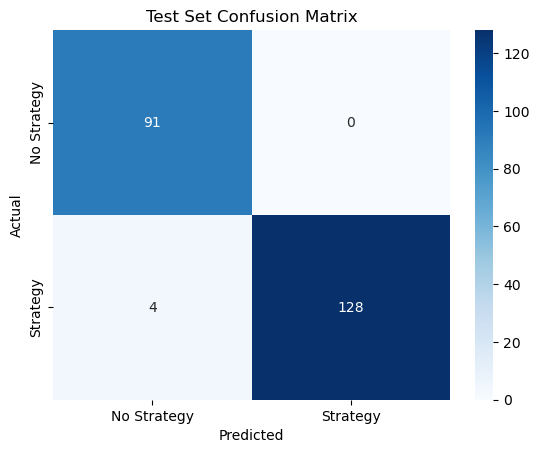

C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
C:\Users\Besher\AppData\Local\Temp\ipykernel_21152\1011287942.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item['labels'] = torch.tensor(self.labels[idx])


Test Results: {'eval_loss': 0.11954734474420547, 'eval_accuracy': 0.9820627802690582, 'eval_f1': 0.9846153846153847, 'eval_precision': 1.0, 'eval_recall': 0.9696969696969697, 'eval_runtime': 0.297, 'eval_samples_per_second': 750.84, 'eval_steps_per_second': 94.276, 'epoch': 10.0}


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def evaluate_with_confusion_matrix(dataset, labels, title="Confusion Matrix"):
    predictions = trainer.predict(dataset).predictions.argmax(-1)
    cm = confusion_matrix(labels, predictions)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()
    return predictions

val_predictions = evaluate_with_confusion_matrix(val_dataset, val_labels, title="Validation Set Confusion Matrix")
print("Validation Results:", trainer.evaluate(eval_dataset=val_dataset))

test_predictions = evaluate_with_confusion_matrix(test_dataset, test_labels, title="Test Set Confusion Matrix")
print("Test Results:", trainer.evaluate(eval_dataset=test_dataset))


### Here i am loading my best model again to see the missclassified samples and use them in lime to see why they are missclassified

In [ ]:
import torch
from transformers import BertTokenizer, BertForSequenceClassification

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

best_model = BertForSequenceClassification.from_pretrained('./results/best_model6').to(device)

print("Model and tokenizer have been successfully loaded.")


Model and tokenizer have been successfully loaded.


In [ ]:
import pandas as pd


train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = df[df['Split'] == 'test']

test_texts = test_df['Expert_Human_Tutor'].tolist()
test_labels = test_df['Label'].tolist()

print("Test dataset has been successfully loaded.")
print(f"Number of test samples: {len(test_texts)}")


Test dataset has been successfully loaded.
Number of test samples: 223


### Missclassified samples in validation and test set :

In [ ]:
import torch
from transformers import BertTokenizer, BertForSequenceClassification
from lime.lime_text import LimeTextExplainer
import pandas as pd

inputs = tokenizer(test_texts, return_tensors="pt", padding=True, truncation=True, max_length=512).to(device)

with torch.no_grad():
    outputs = best_model(**inputs)
predictions = outputs.logits.argmax(dim=1).cpu().numpy()

misclassified_indices = [i for i, (pred, label) in enumerate(zip(predictions, test_labels)) if pred != label]
misclassified_texts = [test_texts[i] for i in misclassified_indices]
misclassified_true_labels = [test_labels[i] for i in misclassified_indices]
misclassified_predictions = [predictions[i] for i in misclassified_indices]

misclassified_df = pd.DataFrame({
    'Text': misclassified_texts,
    'True Label': misclassified_true_labels,
    'Predicted Label': misclassified_predictions
})

print("Misclassified Samples:")
print(misclassified_df)


Misclassified Samples:
                                                Text  True Label  \
0                       Oh, what makes you say that?           1   
1  Yes, since Luciano's train ride is 45 minutes,...           1   
2                                             Great!           1   
3                                 Sorry, I messed up           1   
4  We understand there are sometimes emergencies....           1   
5  Ok, thanks for letting me know! Have a great day!           1   

   Predicted Label  
0                0  
1                0  
2                0  
3                0  
4                0  
5                0  


# Lime Analysis

In [ ]:

def predict_proba(texts):
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=512).to(device)
    with torch.no_grad():
        outputs = best_model(**inputs)
    probs = torch.nn.functional.softmax(outputs.logits, dim=1)
    return probs.cpu().numpy()

explainer = LimeTextExplainer(class_names=['No Strategy', 'Strategy'])

for idx, text in enumerate(misclassified_texts):
    print(f"\nExplanation for Misclassified Sample {idx + 1}:")
    print(f"Text: {text}")
    print(f"True Label: {misclassified_true_labels[idx]}, Predicted Label: {misclassified_predictions[idx]}")

    exp = explainer.explain_instance(text, predict_proba, num_features=10, labels=[1])
    exp.show_in_notebook(text=True)



Explanation for Misclassified Sample 1:
Text: Oh, what makes you say that?
True Label: 1, Predicted Label: 0



Explanation for Misclassified Sample 2:
Text: Yes, since Luciano's train ride is 45 minutes, he would need to leave at the latest at 8:15. Good thinking!
True Label: 1, Predicted Label: 0



Explanation for Misclassified Sample 3:
Text: Great!
True Label: 1, Predicted Label: 0



Explanation for Misclassified Sample 4:
Text: Sorry, I messed up
True Label: 1, Predicted Label: 0



Explanation for Misclassified Sample 5:
Text: We understand there are sometimes emergencies. You only earn full credit, when you stay the entire time. I will have to mark you absent. 
True Label: 1, Predicted Label: 0



Explanation for Misclassified Sample 6:
Text: Ok, thanks for letting me know! Have a great day!
True Label: 1, Predicted Label: 0


# SO the best Model achievd  Best Model Test Set Performance f1 = 98.46% :
Accuracy: 98.21%
F1 Score: 98.46%
Precision: 100.00%
Recall: 96.97%
 which increased from the previous experiment since i have increased the number of samples and i used the Base Bert instead of disilbert

In [ ]:
import shutil

model_dir = './results/best_model6'
output_zip = './results/best_model6.zip'

shutil.make_archive(output_zip.replace('.zip', ''), 'zip', model_dir)

print(f"Model zipped successfully at {output_zip}")


Model zipped successfully at ./results/best_model6.zip


# LLMS classification Evaluation

### Now i will experment with multiple LLMS to see if they will classify the labels correctly or not

# Here i have took 50 samples from the test set :25 from class 0 and 25 from class 1 and then i will check multiple LLMS if they will classify correctly

In [ ]:
import pandas as pd

test_df = pd.read_csv('bridge_test_datatset13Nov.csv')

if 'Label' not in test_df.columns:
    raise ValueError("The dataset must contain a 'label' column indicating class labels.")

class_0_df = test_df[test_df['Label'] == 0]
class_1_df = test_df[test_df['Label'] == 1]

if len(class_0_df) < 25 or len(class_1_df) < 25:
    raise ValueError("Not enough samples in one or both classes to extract 25 samples each.")

sampled_class_0 = class_0_df.sample(n=25, random_state=42)
sampled_class_1 = class_1_df.sample(n=25, random_state=42)

balanced_sample_df = pd.concat([sampled_class_0, sampled_class_1])

balanced_sample_df = balanced_sample_df.sample(frac=1, random_state=42).reset_index(drop=True)

balanced_sample_df.to_csv('LLMs_balanced_test_sample.csv', index=False)

print("Balanced sample saved to 'balanced_test_sample.csv'.")


Balanced sample saved to 'balanced_test_sample.csv'.


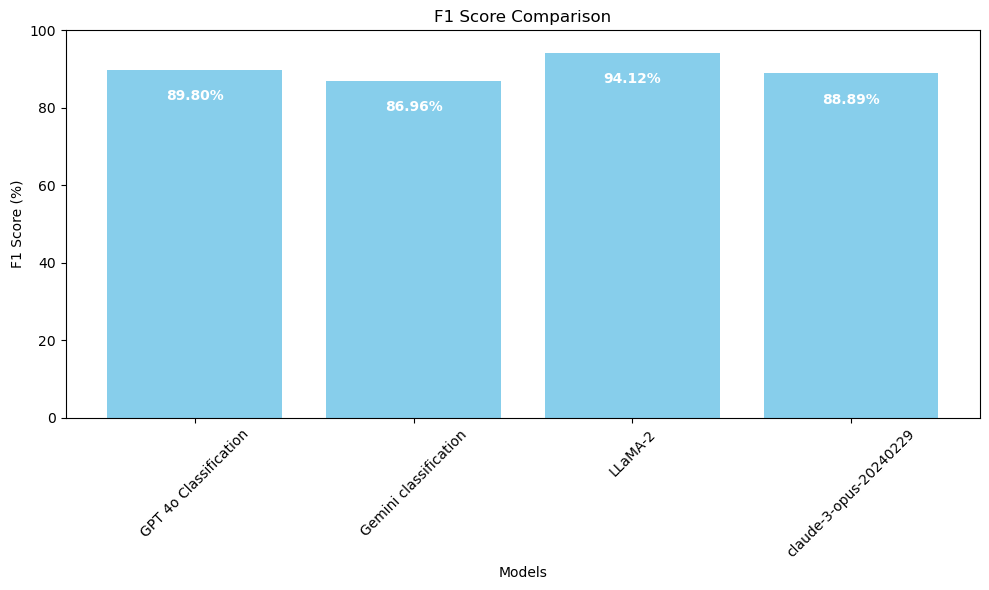

                         F1 Score
Model                            
GPT 4o Classification   89.795918
Gemini classification   86.956522
LLaMA-2                 94.117647
claude-3-opus-20240229  88.888889


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score

df = pd.read_csv('LLMs_balanced_test_sample.csv')

true_labels = df['Label']

models = ["GPT 4o Classification", "Gemini classification", "LLaMA-2", "claude-3-opus-20240229"]

df = df.rename(columns={"ChatGpt 4o Classification": "GPT 4o Classification"})

f1_scores = {model: f1_score(true_labels, df[model]) * 100 for model in models}

f1_df = pd.DataFrame(list(f1_scores.items()), columns=['Model', 'F1 Score']).set_index('Model')

plt.figure(figsize=(10, 6))
bars = plt.bar(f1_df.index, f1_df['F1 Score'], color='skyblue')
plt.title("F1 Score Comparison")
plt.xlabel('Models')
plt.ylabel('F1 Score (%)')
plt.ylim(0, 100)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval - 5, f"{yval:.2f}%", ha='center', va='top', color='white', fontweight='bold')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f1_df)


The LLaMA-2 is the best model among the five models

# Experiment with Classical models :

# Logistic Regression

### Logistic Regression with TF-IDF

### How it works:
### 1. Preprocesses text (lowercase, stopword removal, lemmatization).
### 2. Converts text to numerical features using TF-IDF.
### 3. Trains a Logistic Regression model for binary classification.

### Strengths:
### - Simple and efficient.
### - Works well for text classification with TF-IDF.

Test Classification Report:
              precision    recall  f1-score   support

           0       0.88      1.00      0.94        91
           1       1.00      0.91      0.95       132

    accuracy                           0.95       223
   macro avg       0.94      0.95      0.95       223
weighted avg       0.95      0.95      0.95       223



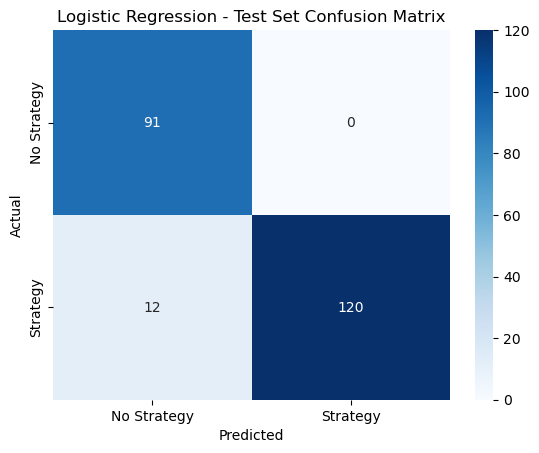

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = pd.read_csv('bridge_data_task1_no_duplicates.csv')
test_df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)
val_df = test_df[test_df['Split'] == 'val']
test_df = test_df[test_df['Split'] == 'test']

def clean_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import re

    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
val_df['text'] = val_df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = test_df['Expert_Human_Tutor'].apply(clean_text)

tfidf = TfidfVectorizer(max_features=10000)

X_train = tfidf.fit_transform(train_df['text'])
X_val = tfidf.transform(val_df['text'])
X_test = tfidf.transform(test_df['text'])

y_train = train_df['Label']
y_val = val_df['Label']
y_test = test_df['Label']

lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)


test_predictions = lr_model.predict(X_test)
print("Test Classification Report:")
print(classification_report(y_test, test_predictions))

cm = confusion_matrix(y_test, test_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Logistic Regression - Test Set Confusion Matrix')
plt.show()




# Support Vector Machine (SVM)

### Support Vector Machine (SVM) with TF-IDF

### 1. Preprocesses text (lowercase, stopword removal, lemmatization).
### 2. Converts text to numerical features using TF-IDF.
### 3. Trains an SVM model with a linear kernel for binary classification.

### Strengths:
### - Effective for high-dimensional spaces like text data.
### - Works well with TF-IDF features for separating classes.


Test Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        91
           1       1.00      0.93      0.96       132

    accuracy                           0.96       223
   macro avg       0.96      0.97      0.96       223
weighted avg       0.96      0.96      0.96       223



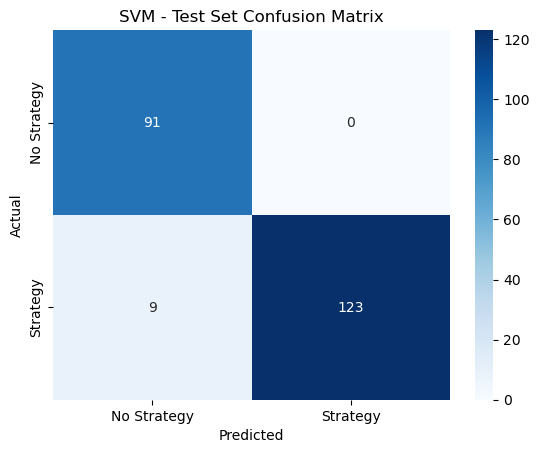

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = pd.read_csv('bridge_data_task1_no_duplicates.csv')

test_df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)

test_df = test_df[test_df['Split'] == 'test']

def clean_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import re

    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = test_df['Expert_Human_Tutor'].apply(clean_text)

tfidf = TfidfVectorizer(max_features=10000)

X_train = tfidf.fit_transform(train_df['text'])
X_test = tfidf.transform(test_df['text'])

y_train = train_df['Label']
y_test = test_df['Label']

svm_model = SVC(kernel='linear', probability=True)  # Use linear kernel
svm_model.fit(X_train, y_train)

test_predictions = svm_model.predict(X_test)
print("Test Classification Report:")
print(classification_report(y_test, test_predictions))

cm = confusion_matrix(y_test, test_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('SVM - Test Set Confusion Matrix')
plt.show()




# Decision Tree

### Decision Tree with TF-IDF

### 1. Preprocesses text (lowercase, stopword removal, lemmatization).
### 2. Converts text to numerical features using TF-IDF.
### 3. Trains a Decision Tree model with a specified depth to classify text as "Strategy" or "No Strategy".

### Strengths:
### - Interpretable and easy to visualize.
### - Handles non-linear decision boundaries effectively.


Test Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.98      0.80        91
           1       0.98      0.68      0.80       132

    accuracy                           0.80       223
   macro avg       0.83      0.83      0.80       223
weighted avg       0.86      0.80      0.80       223



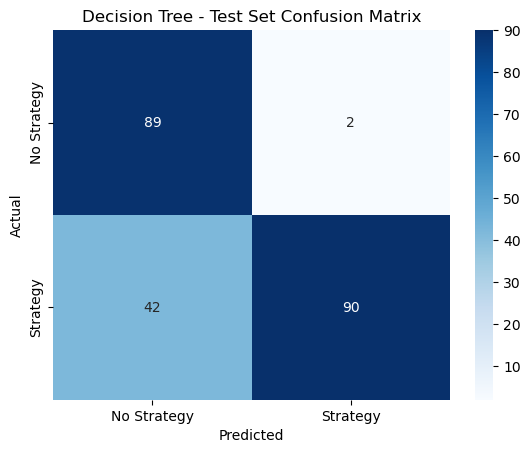

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = pd.read_csv('bridge_data_task1_no_duplicates.csv')

test_df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)

test_df = test_df[test_df['Split'] == 'test']

def clean_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import re

    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = test_df['Expert_Human_Tutor'].apply(clean_text)

tfidf = TfidfVectorizer(max_features=10000)

X_train = tfidf.fit_transform(train_df['text'])
X_test = tfidf.transform(test_df['text'])

y_train = train_df['Label']
y_test = test_df['Label']

dt_model = DecisionTreeClassifier(max_depth=10, random_state=42)
dt_model.fit(X_train, y_train)

test_predictions = dt_model.predict(X_test)
print("Test Classification Report:")
print(classification_report(y_test, test_predictions))

cm = confusion_matrix(y_test, test_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Decision Tree - Test Set Confusion Matrix')
plt.show()




# Random Forest

### Random Forest with TF-IDF

### 1. Preprocesses text (lowercase, stopword removal, lemmatization).
### 2. Converts text to numerical features using TF-IDF.
### 3. Trains a Random Forest model with 100 trees to classify text as "Strategy" or "No Strategy".

### Strengths:
### - Robust and handles overfitting well.
### - Works effectively with high-dimensional TF-IDF features.
### - Provides feature importance for interpretability.


Test Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.97      0.85        91
           1       0.97      0.80      0.88       132

    accuracy                           0.87       223
   macro avg       0.87      0.88      0.86       223
weighted avg       0.89      0.87      0.87       223



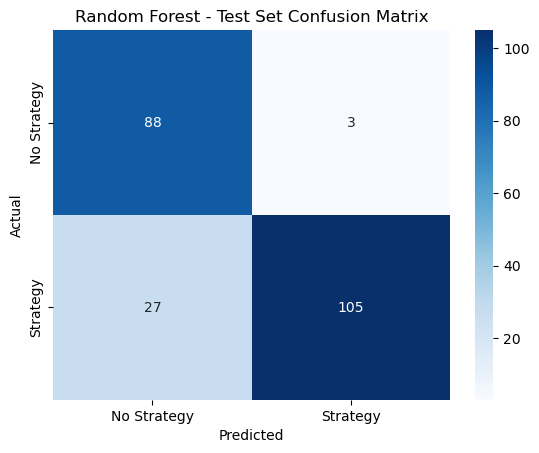

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = pd.read_csv('bridge_data_task1_no_duplicates.csv')

test_df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)

test_df = test_df[test_df['Split'] == 'test']

def clean_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import re

    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = test_df['Expert_Human_Tutor'].apply(clean_text)

tfidf = TfidfVectorizer(max_features=10000)

X_train = tfidf.fit_transform(train_df['text'])
X_test = tfidf.transform(test_df['text'])

y_train = train_df['Label']
y_test = test_df['Label']

rf_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)  # Use 100 trees
rf_model.fit(X_train, y_train)

test_predictions = rf_model.predict(X_test)
print("Test Classification Report:")
print(classification_report(y_test, test_predictions))

cm = confusion_matrix(y_test, test_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Random Forest - Test Set Confusion Matrix')
plt.show()




# XGBoost

### XGBoost with TF-IDF

### 1. Preprocesses text by converting it to lowercase, removing punctuation, lemmatizing words, and eliminating stopwords.
### 2. Converts text into numerical feature vectors using TF-IDF to represent the importance of terms across documents.
### 3. Trains an XGBoost model, an ensemble method based on decision trees, to classify text as "Strategy" or "No Strategy."

### Strengths:
### - Highly efficient and handles large datasets effectively.
### - Combines multiple trees to achieve better accuracy and avoid overfitting.
### - Flexible with hyperparameters like learning rate and maximum tree depth for fine-tuning.


In [ ]:
pip install xgboost

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/124.9 MB ? eta -:--:--
   ---------------------------------------- 1.0/124.9 MB 3.3 MB/s eta 0:00:38
    --------------------------------------- 2.4/124.9 MB 5.0 MB/s eta 0:00:25
   - -------------------------------------- 3.9/124.9 MB 5.5 MB/s eta 0:00:23
   - -------------------------------------- 5.0/124.9 MB 5.5 MB/s eta 0:00:22
   -- ------------------------------------- 6.6/124.9 MB 5.8 MB/s eta 0:00:21
   -- ------------------------------------- 7.9/124.9 MB 5.9 MB/s eta 0:00:20
   --- ------------------------------------ 9.4/124.9 MB 6.1 MB/s eta 0:00:19
   --- ------------------------------------ 11.0/124.9 MB 6.4 MB/s eta 0:00:18
   --- ------------------------------------ 12.1/124.9 MB 6.3 MB/s eta 0:00:18
   ---- --

C:\Users\Besher\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [16:54:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Test Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.93      0.90        91
           1       0.95      0.91      0.93       132

    accuracy                           0.92       223
   macro avg       0.91      0.92      0.92       223
weighted avg       0.92      0.92      0.92       223



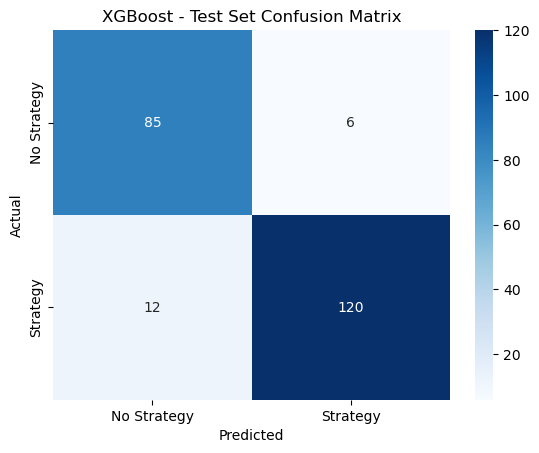

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = pd.read_csv('bridge_data_task1_no_duplicates.csv')

test_df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)

test_df = test_df[test_df['Split'] == 'test']

def clean_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import re

    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = test_df['Expert_Human_Tutor'].apply(clean_text)

tfidf = TfidfVectorizer(max_features=10000)

X_train = tfidf.fit_transform(train_df['text'])
X_test = tfidf.transform(test_df['text'])

y_train = train_df['Label']
y_test = test_df['Label']

xgb_model = XGBClassifier(
    n_estimators=100,
    max_depth=10,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)
xgb_model.fit(X_train, y_train)

test_predictions = xgb_model.predict(X_test)
print("Test Classification Report:")
print(classification_report(y_test, test_predictions))

cm = confusion_matrix(y_test, test_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('XGBoost - Test Set Confusion Matrix')
plt.show()





# LightGBM

### LightGBM with TF-IDF

### 1. Preprocesses text by lowercasing, removing punctuation, lemmatizing words, and removing stopwords.
### 2. Converts text into numerical feature vectors using TF-IDF to capture term importance across documents.
### 3. Trains a LightGBM model, a gradient boosting framework, to classify text as "Strategy" or "No Strategy."

### Strengths:
### - Efficient and fast, even with large datasets.
### - Handles sparse TF-IDF data effectively.
### - Supports advanced features like categorical variable handling and parallel training.


In [ ]:
pip install lightgbm

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   -------------- ------------------------- 0.5/1.4 MB 2.8 MB/s eta 0:00:01
   ---------------------------------------- 1.4/1.4 MB 5.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


[LightGBM] [Info] Number of positive: 1000, number of negative: 1000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2074
[LightGBM] [Info] Number of data points in the train set: 2000, number of used features: 117
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

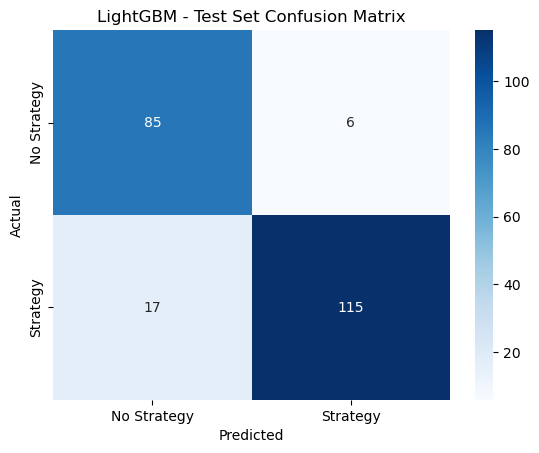

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = pd.read_csv('bridge_data_task1_no_duplicates.csv')

test_df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)

test_df = test_df[test_df['Split'] == 'test']

def clean_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import re

    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = test_df['Expert_Human_Tutor'].apply(clean_text)

tfidf = TfidfVectorizer(max_features=10000)

X_train = tfidf.fit_transform(train_df['text'])
X_test = tfidf.transform(test_df['text'])

y_train = train_df['Label']
y_test = test_df['Label']

lgbm_model = LGBMClassifier(
    n_estimators=100,
    max_depth=10,
    learning_rate=0.1,
    random_state=42
)
lgbm_model.fit(X_train, y_train)

test_predictions = lgbm_model.predict(X_test)
print("Test Classification Report:")
print(classification_report(y_test, test_predictions))

cm = confusion_matrix(y_test, test_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('LightGBM - Test Set Confusion Matrix')
plt.show()




# AdaBoost

### AdaBoost with TF-IDF

### 1. Preprocesses text by converting it to lowercase, removing punctuation, lemmatizing words, and eliminating stopwords.
### 2. Converts text into numerical feature vectors using TF-IDF to capture the importance of terms across documents.
### 3. Trains an AdaBoost model, an ensemble learning method that builds a strong classifier by combining weak learners iteratively.

### Strengths:
### - Effective for moderately imbalanced datasets.
### - Reduces overfitting by focusing on difficult-to-classify samples.
### - Versatile and can work well with sparse TF-IDF data.


C:\Users\Besher\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Test Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.96      0.84        91
           1       0.96      0.78      0.86       132

    accuracy                           0.85       223
   macro avg       0.86      0.87      0.85       223
weighted avg       0.88      0.85      0.85       223



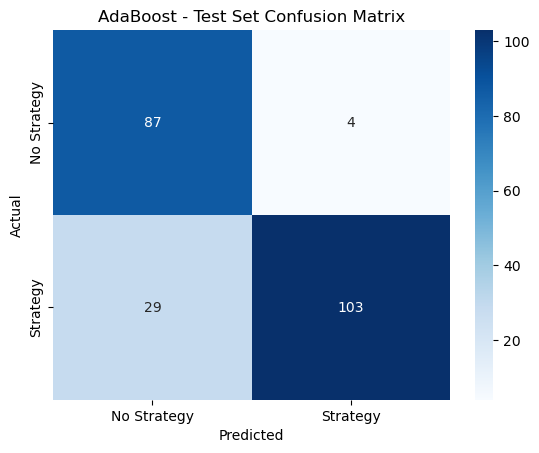

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = pd.read_csv('bridge_data_task1_no_duplicates.csv')

test_df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)

test_df = test_df[test_df['Split'] == 'test']

def clean_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import re

    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = test_df['Expert_Human_Tutor'].apply(clean_text)

tfidf = TfidfVectorizer(max_features=10000)

X_train = tfidf.fit_transform(train_df['text'])
X_test = tfidf.transform(test_df['text'])

y_train = train_df['Label']
y_test = test_df['Label']

adaboost_model = AdaBoostClassifier(
    n_estimators=100,
    learning_rate=0.1,
    random_state=42
)
adaboost_model.fit(X_train, y_train)

test_predictions = adaboost_model.predict(X_test)
print("Test Classification Report:")
print(classification_report(y_test, test_predictions))

cm = confusion_matrix(y_test, test_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('AdaBoost - Test Set Confusion Matrix')
plt.show()



# K-Nearest Neighbors (KNN)

### K-Nearest Neighbors (KNN) with TF-IDF

### 1. Preprocesses text by lowercasing, removing punctuation, lemmatizing words, and removing stopwords.
### 2. Converts text into numerical feature vectors using TF-IDF to represent term importance.
### 3. Trains a KNN model to classify text by finding the 5 nearest neighbors in the feature space using Euclidean distance.

### Strengths:
### - Simple and interpretable.
### - Non-parametric, making it flexible for various datasets.
### - Effective for small datasets and straightforward classification tasks.


Test Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65        91
           1       1.00      0.27      0.43       132

    accuracy                           0.57       223
   macro avg       0.74      0.64      0.54       223
weighted avg       0.79      0.57      0.52       223



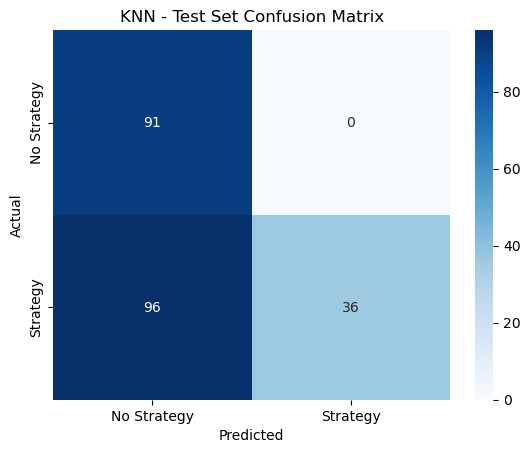

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(
    n_neighbors=5,
    metric='euclidean'
)
knn_model.fit(X_train, y_train)

test_predictions = knn_model.predict(X_test)
print("Test Classification Report:")
print(classification_report(y_test, test_predictions))

cm = confusion_matrix(y_test, test_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('KNN - Test Set Confusion Matrix')
plt.show()






# Naive Bayes

### Multinomial Naive Bayes with TF-IDF

### 1. Preprocesses text by lowercasing, removing punctuation, lemmatizing words, and eliminating stopwords.
### 2. Converts text into numerical feature vectors using TF-IDF to represent term importance across documents.
### 3. Trains a Multinomial Naive Bayes model, which assumes that the features (terms) follow a multinomial distribution.

### Strengths:
### - Highly efficient and works well with text classification tasks.
### - Particularly effective for high-dimensional data like TF-IDF.
### - Simple and interpretable, suitable for quick prototyping and baseline performance.


Test Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97        91
           1       0.99      0.97      0.98       132

    accuracy                           0.98       223
   macro avg       0.97      0.98      0.98       223
weighted avg       0.98      0.98      0.98       223



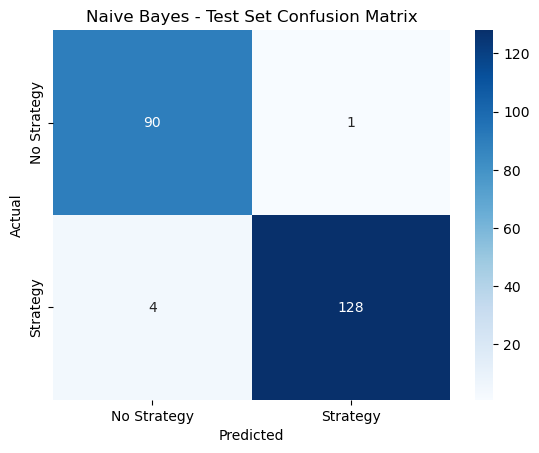

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = pd.read_csv('bridge_data_task1_no_duplicates.csv')

test_df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)

test_df = test_df[test_df['Split'] == 'test']

def clean_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import re

    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = test_df['Expert_Human_Tutor'].apply(clean_text)

tfidf = TfidfVectorizer(max_features=10000)

X_train = tfidf.fit_transform(train_df['text'])
X_test = tfidf.transform(test_df['text'])

y_train = train_df['Label']
y_test = test_df['Label']

nb_model = MultinomialNB()
nb_model.fit(X_train, y_train)

test_predictions = nb_model.predict(X_test)
print("Test Classification Report:")
print(classification_report(y_test, test_predictions))

cm = confusion_matrix(y_test, test_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Naive Bayes - Test Set Confusion Matrix')
plt.show()






# Linear Discriminant Analysis (LDA)

### Linear Discriminant Analysis (LDA) with TF-IDF

### 1. Preprocesses text by lowercasing, removing punctuation, lemmatizing words, and eliminating stopwords.
### 2. Converts text into numerical feature vectors using TF-IDF and transforms them into dense arrays (required for LDA).
### 3. Trains a Linear Discriminant Analysis model, which finds linear combinations of features that best separate classes.

### Strengths:
### - Effective for linearly separable data.
### - Works well with smaller datasets.
### - Provides insights into class separability through linear discriminants.


Test Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93        91
           1       0.94      0.97      0.96       132

    accuracy                           0.95       223
   macro avg       0.95      0.94      0.94       223
weighted avg       0.95      0.95      0.95       223



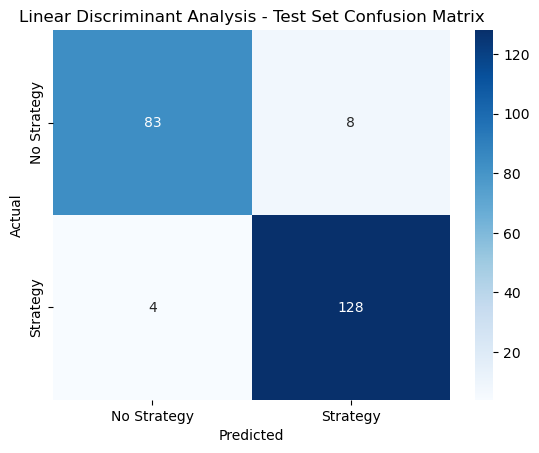

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = pd.read_csv('bridge_data_task1_no_duplicates.csv')

test_df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)

test_df = test_df[test_df['Split'] == 'test']

def clean_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import re

    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = test_df['Expert_Human_Tutor'].apply(clean_text)

tfidf = TfidfVectorizer(max_features=10000)

X_train = tfidf.fit_transform(train_df['text']).toarray()
X_test = tfidf.transform(test_df['text']).toarray()

y_train = train_df['Label']
y_test = test_df['Label']

lda_model = LinearDiscriminantAnalysis()
lda_model.fit(X_train, y_train)

test_predictions = lda_model.predict(X_test)
print("Test Classification Report:")
print(classification_report(y_test, test_predictions))

cm = confusion_matrix(y_test, test_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Linear Discriminant Analysis - Test Set Confusion Matrix')
plt.show()



# Multi-Layer Perceptron


### Multi-Layer Perceptron (MLP) with TF-IDF

### 1. Preprocesses text by lowercasing, removing punctuation, lemmatizing words, and eliminating stopwords.
### 2. Converts text into numerical feature vectors using TF-IDF and transforms them into dense arrays.
### 3. Implements an MLP neural network with one hidden layer to classify text as "Strategy" or "No Strategy."

### Strengths:
### - Flexible and can model complex relationships in data.
### - Suitable for high-dimensional inputs like TF-IDF features.
### - Scales well with larger datasets using batch-based training.


Epoch 1/10, Loss: 38.6505
Epoch 2/10, Loss: 16.1477
Epoch 3/10, Loss: 6.1073
Epoch 4/10, Loss: 3.6493
Epoch 5/10, Loss: 2.6342
Epoch 6/10, Loss: 2.0172
Epoch 7/10, Loss: 1.6544
Epoch 8/10, Loss: 1.3524
Epoch 9/10, Loss: 1.1555
Epoch 10/10, Loss: 0.9992
Test Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        91
           1       1.00      0.97      0.98       132

    accuracy                           0.98       223
   macro avg       0.98      0.98      0.98       223
weighted avg       0.98      0.98      0.98       223



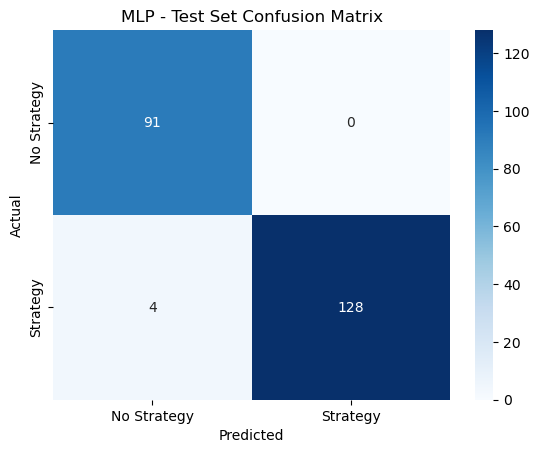

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, Dataset

train_df = pd.read_csv('bridge_train_datatset13Nov.csv')
test_df = pd.read_csv('bridge_data_task1_no_duplicates.csv')

test_df.rename(columns={"Unnamed: 4": "Expert_Human_Tutor"}, inplace=True)

test_df = test_df[test_df['Split'] == 'test']

def clean_text(text):
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import re

    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])
    return text.strip()

train_df['text'] = train_df['Expert_Human_Tutor'].apply(clean_text)
test_df['text'] = test_df['Expert_Human_Tutor'].apply(clean_text)

tfidf = TfidfVectorizer(max_features=10000)

X_train = tfidf.fit_transform(train_df['text']).toarray()
X_test = tfidf.transform(test_df['text']).toarray()

y_train = train_df['Label'].values
y_test = test_df['Label'].values

class TextDataset(Dataset):
    def __init__(self, features, labels):
        self.features = torch.tensor(features, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.long)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.features[idx], self.labels[idx]

train_dataset = TextDataset(X_train, y_train)
test_dataset = TextDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32)

class MLP(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

input_dim = X_train.shape[1]
hidden_dim = 128
output_dim = len(set(y_train))

model = MLP(input_dim, hidden_dim, output_dim)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    for features, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(features)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {total_loss:.4f}")

model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for features, labels in test_loader:
        outputs = model(features)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.numpy())
        all_labels.extend(labels.numpy())

print("Test Classification Report:")
print(classification_report(all_labels, all_preds))

cm = confusion_matrix(all_labels, all_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Strategy', 'Strategy'], yticklabels=['No Strategy', 'Strategy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('MLP - Test Set Confusion Matrix')
plt.show()






# Table, summary of the models Scores:

In [ ]:
import pandas as pd

model_metrics = []

models = [
    {"Model": "BERT Before fine Tuning", "Precision": 0.63, "Recall": 0.98, "F1-Score": 0.77},
    {"Model": "BERT After fine Tuning", "Precision": 1.0, "Recall": 0.97, "F1-Score": 0.985},
    {"Model": "Logistic Regression", "Precision": 0.95, "Recall": 0.95, "F1-Score": 0.95},
    {"Model": "SVM", "Precision": 0.96, "Recall": 0.96, "F1-Score": 0.96},
    {"Model": "Decision Tree", "Precision": 0.86, "Recall": 0.80, "F1-Score": 0.80},
    {"Model": "Random Forest", "Precision": 0.89, "Recall": 0.87, "F1-Score": 0.87},
    {"Model": "XGBoost", "Precision": 0.92, "Recall": 0.92, "F1-Score": 0.92},
    {"Model": "LightGBM", "Precision": 0.90, "Recall": 0.90, "F1-Score": 0.90},
    {"Model": "AdaBoost", "Precision": 0.88, "Recall": 0.85, "F1-Score": 0.85},
    {"Model": "KNN", "Precision": 0.79, "Recall": 0.57, "F1-Score": 0.52},
    {"Model": "Naive Bayes", "Precision": 0.98, "Recall": 0.98, "F1-Score": 0.98},
    {"Model": "LDA", "Precision": 0.95, "Recall": 0.95, "F1-Score": 0.95},
    {"Model": "MLP", "Precision": 0.98, "Recall": 0.98, "F1-Score": 0.98},

]
for model in models:
    model_metrics.append(model)

metrics_table = pd.DataFrame(model_metrics)

print(metrics_table)


                      Model  Precision  Recall  F1-Score
0   BERT Before fine Tuning       0.63    0.98     0.770
1    BERT After fine Tuning       1.00    0.97     0.985
2       Logistic Regression       0.95    0.95     0.950
3                       SVM       0.96    0.96     0.960
4             Decision Tree       0.86    0.80     0.800
5             Random Forest       0.89    0.87     0.870
6                   XGBoost       0.92    0.92     0.920
7                  LightGBM       0.90    0.90     0.900
8                  AdaBoost       0.88    0.85     0.850
9                       KNN       0.79    0.57     0.520
10              Naive Bayes       0.98    0.98     0.980
11                      LDA       0.95    0.95     0.950
12                      MLP       0.98    0.98     0.980


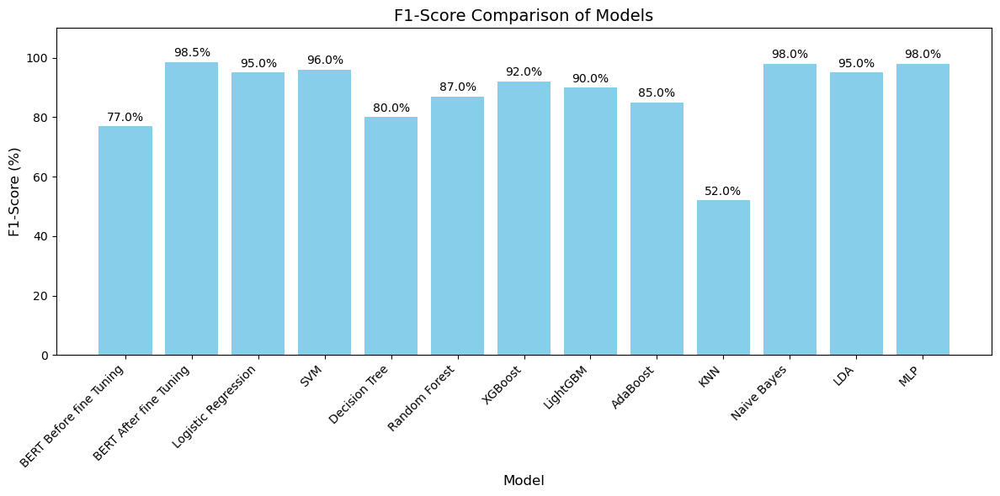

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

models = [
    {"Model": "BERT Before fine Tuning", "Precision": 0.63, "Recall": 0.98, "F1-Score": 0.77},
    {"Model": "BERT After fine Tuning", "Precision": 1.0, "Recall": 0.97, "F1-Score": 0.985},
    {"Model": "Logistic Regression", "Precision": 0.95, "Recall": 0.95, "F1-Score": 0.95},
    {"Model": "SVM", "Precision": 0.96, "Recall": 0.96, "F1-Score": 0.96},
    {"Model": "Decision Tree", "Precision": 0.86, "Recall": 0.80, "F1-Score": 0.80},
    {"Model": "Random Forest", "Precision": 0.89, "Recall": 0.87, "F1-Score": 0.87},
    {"Model": "XGBoost", "Precision": 0.92, "Recall": 0.92, "F1-Score": 0.92},
    {"Model": "LightGBM", "Precision": 0.90, "Recall": 0.90, "F1-Score": 0.90},
    {"Model": "AdaBoost", "Precision": 0.88, "Recall": 0.85, "F1-Score": 0.85},
    {"Model": "KNN", "Precision": 0.79, "Recall": 0.57, "F1-Score": 0.52},
    {"Model": "Naive Bayes", "Precision": 0.98, "Recall": 0.98, "F1-Score": 0.98},
    {"Model": "LDA", "Precision": 0.95, "Recall": 0.95, "F1-Score": 0.95},
    {"Model": "MLP", "Precision": 0.98, "Recall": 0.98, "F1-Score": 0.98},
]


metrics_table["F1-Score (%)"] = metrics_table["F1-Score"] * 100

plt.figure(figsize=(12, 6))
bars = plt.bar(metrics_table["Model"], metrics_table["F1-Score (%)"], color="skyblue")

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 1, f"{yval:.1f}%", ha='center', va='bottom', fontsize=10)

plt.xticks(rotation=45, ha="right", fontsize=10)
plt.title("F1-Score Comparison of Models", fontsize=14)
plt.xlabel("Model", fontsize=12)
plt.ylabel("F1-Score (%)", fontsize=12)
plt.ylim(0, 110)
plt.tight_layout()
plt.show()



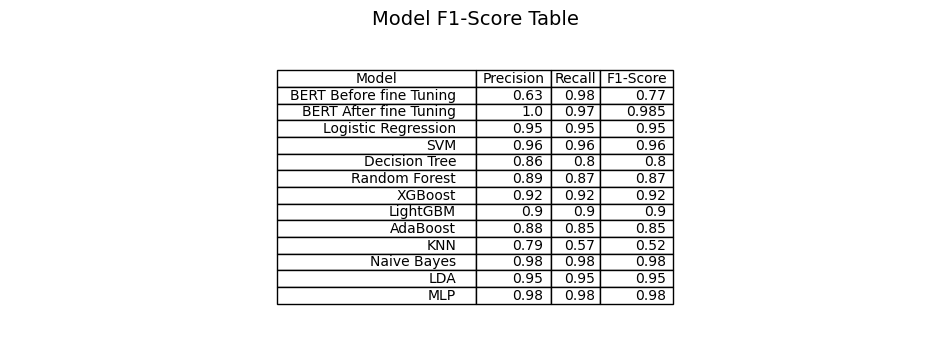

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

metrics_table = pd.DataFrame(models)

fig, ax = plt.subplots(figsize=(12, 4))
ax.axis("tight")
ax.axis("off")
table = ax.table(cellText=metrics_table.values, colLabels=metrics_table.columns, loc="center")
table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width(col=list(range(len(metrics_table.columns))))

plt.title("Model F1-Score Table", fontsize=14)
plt.show()


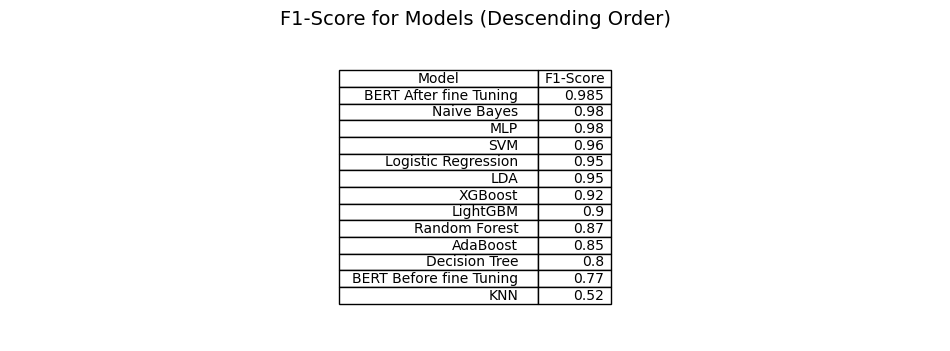

In [ ]:
sorted_metrics = metrics_table[["Model", "F1-Score"]].sort_values(by="F1-Score", ascending=False)

fig, ax = plt.subplots(figsize=(12, 4))
ax.axis("tight")
ax.axis("off")
table = ax.table(cellText=sorted_metrics.values, colLabels=sorted_metrics.columns, loc="center")
table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width(col=list(range(len(sorted_metrics.columns))))

plt.title("F1-Score for Models (Descending Order)", fontsize=14)
plt.show()


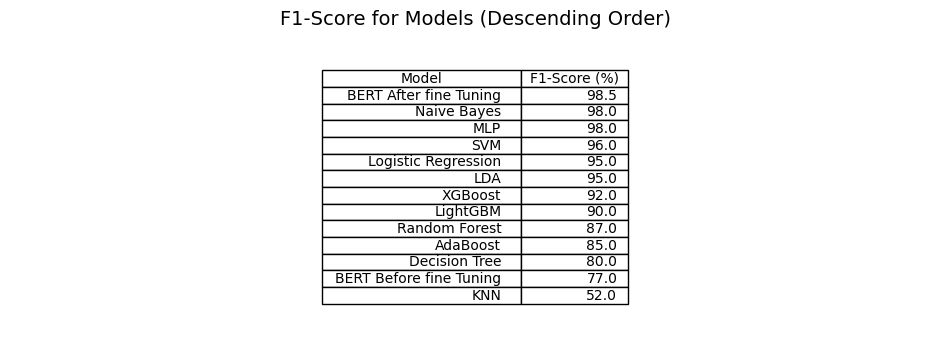

In [ ]:

metrics_table["F1-Score (%)"] = metrics_table["F1-Score"] * 100

sorted_metrics = metrics_table[["Model", "F1-Score (%)"]].sort_values(by="F1-Score (%)", ascending=False)

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 4))
ax.axis("tight")
ax.axis("off")
table = ax.table(cellText=sorted_metrics.values, colLabels=sorted_metrics.columns, loc="center")
table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width(col=list(range(len(sorted_metrics.columns))))

plt.title("F1-Score for Models (Descending Order)", fontsize=14)
plt.show()
